# Viewshed Analysis for Ham Radio Repeater Coverage

This notebook demonstrates how to perform viewshed analysis to evaluate ham radio repeater coverage using terrain data. We compare **xarray-spatial** (CPU) with **rtxpy** (GPU-accelerated ray tracing) for performance benchmarking.

## What is Viewshed Analysis?

A viewshed is the geographical area that is visible from a specific location. For any point on a terrain surface, the viewshed identifies all other points that have an unobstructed line of sight to that location.

## Why Does This Matter for Ham Radio?

VHF and UHF radio waves (like those used by most ham radio repeaters) propagate primarily via **line-of-sight**. Unlike HF frequencies that can bounce off the ionosphere, VHF/UHF signals are blocked by terrain features like mountains and hills.

This means:
- A repeater's coverage area is largely determined by what terrain is visible from its antenna
- Higher antenna placements generally provide better coverage
- Mountains can create "radio shadows" where signals can't reach

## What We'll Build

1. Download real elevation data for the Colorado Front Range
2. Reproject to EPSG:5070 (Albers Equal Area) for accurate distance calculations
3. Query the RepeaterBook API for actual repeater locations
4. Compute viewsheds for each repeater (CPU vs GPU comparison)
5. **Benchmark rtxpy GPU acceleration** vs xrspatial CPU
6. Visualize coverage and identify gaps
7. **Simulate a "Lost Hiker" rescue scenario** using terrain slope analysis to find a safe path to radio coverage

## 1. Setup and Dependencies

First, let's import all the libraries we'll need.

### Installation

Before running this notebook, install the required packages:

```bash
# Core dependencies
pip install xarray-spatial rioxarray pandas requests matplotlib scipy pyproj

# For GPU acceleration (requires NVIDIA GPU with CUDA and OptiX)
pip install cupy-cuda12x
pip install rtxpy[analysis]  # Includes rtxpy with analysis dependencies
```

Or using conda:
```bash
conda install -c conda-forge xarray-spatial rioxarray pandas requests matplotlib scipy pyproj
```

**Note:** GPU acceleration via rtxpy requires:
- NVIDIA GPU with RTX or Turing architecture (for OptiX ray tracing)
- CUDA 12.x installed
- cupy-cuda12x Python package

In [1]:
# Core data handling
import xarray as xr
import numpy as np
import pandas as pd

# Spatial analysis (CPU baseline)
from xrspatial import viewshed as xrspatial_viewshed
from xrspatial import hillshade as xrspatial_hillshade
import rioxarray as rxr
from pyproj import Transformer

# Visualization
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches

# API access / downloading
import requests
import io
import zipfile

# Utilities
import os
import time
from pathlib import Path

# Check for GPU support via rtxpy
GPU_AVAILABLE = False
try:
    import cupy as cp
    from rtxpy import RTX, viewshed as rtxpy_viewshed, hillshade as rtxpy_hillshade
    GPU_AVAILABLE = True
    print(f"GPU support available via rtxpy + CuPy (CUDA version: {cp.cuda.runtime.runtimeGetVersion()})")
except ImportError as e:
    print(f"rtxpy/CuPy not available - GPU acceleration disabled: {e}")
except Exception as e:
    print(f"GPU initialization failed: {e} - GPU acceleration disabled")

print(f"\nGPU acceleration: {'Enabled (rtxpy)' if GPU_AVAILABLE else 'Disabled (CPU only)'}")

GPU support available via rtxpy + CuPy (CUDA version: 13000)

GPU acceleration: Enabled (rtxpy)


## 2. Define Study Area

We'll focus on the **Colorado Front Range** around Denver. This area has excellent terrain variability - from the flat plains east of Denver to the Rocky Mountain foothills to the west - making it ideal for demonstrating viewshed analysis.

Our study area is approximately 50km x 50km, which provides a good balance between computational time and coverage area.

We'll use **EPSG:5070** (Albers Equal Area Conic) as our working projection. This projection:
- Preserves area (important for coverage calculations)
- Uses meters as the unit (easier to interpret distances)
- Is well-suited for the contiguous United States

In [2]:
# Define bounding box in WGS84 (west, south, east, north)
# Colorado Front Range - Denver metro and foothills
BOUNDS_WGS84 = (-105.4, 39.55, -104.85, 40.05)

# Unpack for clarity
WEST, SOUTH, EAST, NORTH = BOUNDS_WGS84

# Target CRS for analysis
TARGET_CRS = "EPSG:5070"  # Albers Equal Area Conic

print(f"Study Area Bounds (WGS84):")
print(f"  West:  {WEST}")
print(f"  East:  {EAST}")
print(f"  South: {SOUTH}")
print(f"  North: {NORTH}")
print(f"\nTarget CRS: {TARGET_CRS}")
print(f"\nApproximate dimensions:")
print(f"  Width:  ~{abs(EAST - WEST) * 85:.0f} km")
print(f"  Height: ~{abs(NORTH - SOUTH) * 111:.0f} km")

Study Area Bounds (WGS84):
  West:  -105.4
  East:  -104.85
  South: 39.55
  North: 40.05

Target CRS: EPSG:5070

Approximate dimensions:
  Width:  ~47 km
  Height: ~56 km


## 3. Download Elevation Data

We'll download SRTM (Shuttle Radar Topography Mission) 1-arc-second (~30m) data directly from the USGS. The data is freely available as GeoTIFF files organized by latitude/longitude tiles.

After downloading, we'll reproject to EPSG:5070 for our analysis.

In [13]:
def download_srtm_tiles(bounds, output_path):
    """
    Download SRTM 1-arc-second tiles covering the given WGS84 bounding box.
    
    Tiles are fetched from the USGS National Map S3 bucket.
    Each tile covers a 1x1 degree area and is named by its southwest corner,
    e.g., n39w106 covers latitudes 39-40N and longitudes 105-106W.
    """
    import math
    west, south, east, north = bounds
    
    # Determine which 1x1 degree tiles we need
    lat_min = math.floor(south)
    lat_max = math.floor(north)
    lon_min = math.floor(west)
    lon_max = math.floor(east)
    
    tile_paths = []
    base_url = "https://prd-tnm.s3.amazonaws.com/StagedProducts/Elevation/1/TIFF/current"
    
    for lat in range(lat_min, lat_max + 1):
        for lon in range(lon_min, lon_max + 1):
            ns = "n" if lat >= 0 else "s"
            ew = "w" if lon < 0 else "e"
            tile_name = f"{ns}{abs(lat):02d}{ew}{abs(lon):03d}"
            url = f"{base_url}/{tile_name}/USGS_1_{tile_name}.tif"
            
            tile_path = output_path.parent / f"USGS_1_{tile_name}.tif"
            
            if not tile_path.exists():
                print(f"  Downloading {tile_name}...")
                resp = requests.get(url, timeout=120)
                resp.raise_for_status()
                tile_path.write_bytes(resp.content)
            else:
                print(f"  Using cached {tile_name}")
            
            tile_paths.append(tile_path)
    
    # Open all tiles
    tiles = [rxr.open_rasterio(str(p), masked=True).squeeze() for p in tile_paths]
    
    if len(tiles) == 1:
        merged = tiles[0]
    else:
        from rioxarray.merge import merge_arrays
        merged = merge_arrays(tiles)
    
    # Clip to bounding box
    merged = merged.rio.clip_box(minx=west, miny=south, maxx=east, maxy=north)
    
    # Save clipped result
    merged.rio.to_raster(str(output_path))
    print(f"  Saved clipped DEM to {output_path}")
    
    # Clean up individual tiles
    for p in tile_paths:
        if p != output_path and p.exists():
            p.unlink()
    
    return merged


# Output file path
DEM_FILE_WGS84 = Path.cwd().resolve() / "denver_dem_wgs84.tif"

# Download DEM if not already present
if not DEM_FILE_WGS84.exists():
    print("Downloading SRTM elevation data...")
    print("(This may take a minute on first run)")
    download_srtm_tiles(BOUNDS_WGS84, DEM_FILE_WGS84)
    print("Download complete!")
else:
    print(f"Using existing DEM file: {DEM_FILE_WGS84}")

# Load and reproject to EPSG:5070
print(f"\nReprojecting to {TARGET_CRS}...")
dem_wgs84 = rxr.open_rasterio(DEM_FILE_WGS84, masked=True).squeeze()
dem = dem_wgs84.rio.reproject(TARGET_CRS)

# Drop the band coordinate if present and set a name
if 'band' in dem.coords:
    dem = dem.drop_vars('band')
dem.name = 'elevation'

# Clip 20 pixels from each edge to remove the NaN collar from reprojection
collar = 165
dem = dem.isel(y=slice(collar, -collar), x=slice(collar, -collar))
dem.values = np.asarray(dem.values, dtype=np.float64)
print(f"Clipped {collar}px collar from edges")

# Display basic info
print(f"\nDEM Properties:")
print(f"  Shape: {dem.shape}")
print(f"  CRS: {dem.rio.crs}")
res_x, res_y = dem.rio.resolution()
print(f"  Resolution: {abs(res_x):.1f}m x {abs(res_y):.1f}m")
print(f"  X range: {float(dem.x.min()):.0f} to {float(dem.x.max()):.0f} m")
print(f"  Y range: {float(dem.y.min()):.0f} to {float(dem.y.max()):.0f} m")
print(f"  Elevation range: {float(dem.min()):.0f}m to {float(dem.max()):.0f}m")

Using existing DEM file: /home/brendan/rtxpy/examples/denver_dem_wgs84.tif

Reprojecting to EPSG:5070...
Clipped 165px collar from edges

DEM Properties:
  Shape: (1711, 1581)
  CRS: EPSG:5070
  Resolution: 26.9m x 26.9m
  X range: -794712 to -752251 m
  Y range: 1876072 to 1922026 m
  Elevation range: 1518m to 2979m


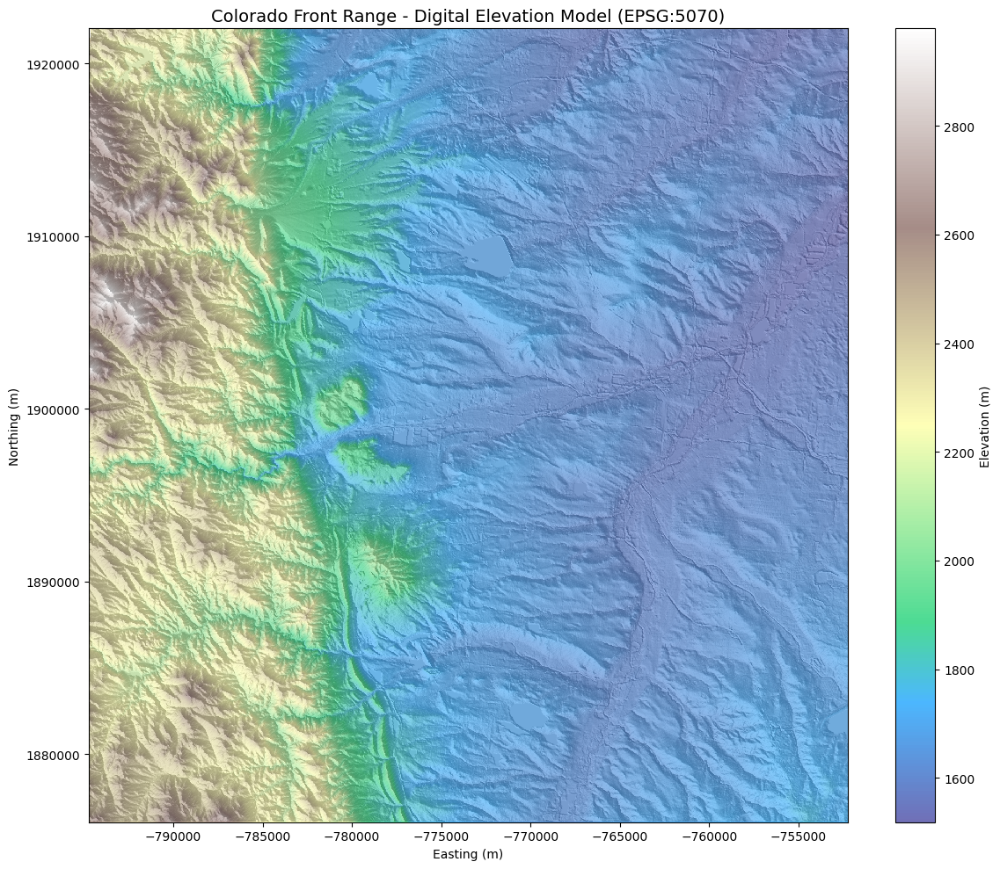

In [14]:
# Visualize the DEM
fig, ax = plt.subplots(figsize=(12, 10))

# Create a hillshade for better visualization (using xrspatial for CPU)
hs = xrspatial_hillshade(dem)

# Plot elevation with hillshade overlay
dem.plot(ax=ax, cmap='terrain', alpha=0.7, add_colorbar=True,
         cbar_kwargs={'label': 'Elevation (m)'})
hs.plot(ax=ax, cmap='gray', alpha=0.3, add_colorbar=False)

ax.set_title('Colorado Front Range - Digital Elevation Model (EPSG:5070)', fontsize=14)
ax.set_xlabel('Easting (m)')
ax.set_ylabel('Northing (m)')
ax.ticklabel_format(style='plain')  # Don't use scientific notation

plt.tight_layout()
plt.show()

## 4. Query RepeaterBook API

RepeaterBook maintains a comprehensive database of amateur radio repeaters. We'll query their API to get actual repeater locations in Colorado.

**Note:** The API requires a User-Agent header. Please use your own callsign or email in a real application.

In [15]:
def get_repeaters(state_id='08', frequency_band='146%'):
    """
    Query RepeaterBook API for repeaters.
    
    Parameters:
    - state_id: State ID code (08 = Colorado)
    - frequency_band: Frequency filter (146% = 2m band starting with 146 MHz)
    
    Returns:
    - DataFrame with repeater information
    """
    url = 'https://www.repeaterbook.com/api/export.php'
    params = {
        'state_id': state_id,
        'frequency': frequency_band
    }
    headers = {
        'User-Agent': 'ViewshedAnalysisNotebook/1.0 (educational-demo)'
    }
    
    response = requests.get(url, params=params, headers=headers)
    response.raise_for_status()
    
    data = response.json()
    
    if 'results' in data:
        return pd.DataFrame(data['results'])
    else:
        return pd.DataFrame(data)

# Fetch Colorado 2m repeaters
print("Querying RepeaterBook API for Colorado 2m repeaters...")
try:
    repeaters_raw = get_repeaters(state_id='08', frequency_band='146%')
    print(f"Retrieved {len(repeaters_raw)} repeaters")
except requests.RequestException as e:
    print(f"API request failed: {e}")
    print("Using sample data instead...")
    # Fallback sample data for demonstration
    repeaters_raw = pd.DataFrame({
        'Callsign': ['W0TLM', 'N0VOF', 'W0CDS', 'K0MTN', 'N0DN'],
        'Frequency': ['146.940', '146.760', '146.820', '146.700', '146.880'],
        'Lat': ['39.7392', '39.6478', '39.8500', '39.7800', '39.9200'],
        'Long': ['-104.9903', '-105.1200', '-105.0500', '-105.2500', '-105.1000'],
        'City': ['Denver', 'Lakewood', 'Westminster', 'Golden', 'Thornton'],
        'Landmark': ['Downtown', 'Green Mtn', 'Standley Lake', 'Lookout Mtn', 'North Area']
    })

Querying RepeaterBook API for Colorado 2m repeaters...
API request failed: 401 Client Error: Unauthorized for url: https://www.repeaterbook.com/api/export.php?state_id=08&frequency=146%25
Using sample data instead...


In [16]:


# Convert coordinates to numeric
repeaters = repeaters_raw.copy()
repeaters['lat'] = pd.to_numeric(repeaters['Lat'], errors='coerce')
repeaters['lon'] = pd.to_numeric(repeaters['Long'], errors='coerce')

# Filter to WGS84 bounding box first
mask = (
    (repeaters['lon'] >= WEST) & 
    (repeaters['lon'] <= EAST) & 
    (repeaters['lat'] >= SOUTH) & 
    (repeaters['lat'] <= NORTH)
)
repeaters = repeaters[mask].copy()

# Transform repeater coordinates to EPSG:5070
transformer = Transformer.from_crs("EPSG:4326", TARGET_CRS, always_xy=True)
repeaters['x_5070'], repeaters['y_5070'] = transformer.transform(
    repeaters['lon'].values, 
    repeaters['lat'].values
)

# Get DEM bounds in EPSG:5070
dem_xmin, dem_xmax = float(dem.x.min()), float(dem.x.max())
dem_ymin, dem_ymax = float(dem.y.min()), float(dem.y.max())

# Filter to repeaters within DEM bounds
mask_5070 = (
    (repeaters['x_5070'] >= dem_xmin) &
    (repeaters['x_5070'] <= dem_xmax) &
    (repeaters['y_5070'] >= dem_ymin) &
    (repeaters['y_5070'] <= dem_ymax)
)
repeaters = repeaters[mask_5070].copy()

print(f"\nRepeaters within study area: {len(repeaters)}")
print("\nRepeater summary (with EPSG:5070 coordinates):")
if 'Callsign' in repeaters.columns and 'Frequency' in repeaters.columns:
    display_cols = ['Callsign', 'Frequency', 'City', 'x_5070', 'y_5070']
    display_cols = [c for c in display_cols if c in repeaters.columns]
    print(repeaters[display_cols].head(10).to_string(index=False))


Repeaters within study area: 5

Repeater summary (with EPSG:5070 coordinates):
Callsign Frequency        City         x_5070       y_5070
   W0TLM   146.940      Denver -762409.047764 1.893844e+06
   N0VOF   146.760    Lakewood -774355.938605 1.884696e+06
   W0CDS   146.820 Westminster -766275.976503 1.906684e+06
   K0MTN   146.700      Golden -783919.598794 1.900507e+06
    N0DN   146.880    Thornton -769746.701844 1.914896e+06


## 5. Viewshed Analysis - Theory

The `xrspatial.viewshed()` function calculates visibility from a given point. Key parameters:

- **x, y**: Observer location in **data-space coordinates** (the coordinate system of the raster)
- **observer_elev**: Height of the observer above the terrain (e.g., antenna tower height)
- **target_elev**: Height of the target above terrain (e.g., handheld radio at 1.5m)

The function returns:
- **-1**: Location is not visible from the observer
- **0-180**: Visibility angle (90° = horizontal line of sight)

**Important:** The x, y parameters are in the raster's coordinate system (EPSG:5070 meters in our case), NOT pixel indices!

For ham radio:
- Repeaters typically have antennas 10-50m above ground level (on towers or building rooftops)
- Mobile stations might be at ~2m (car roof)
- Handheld radios at ~1.5m

## 6. Viewshed Configuration

Set up the parameters and helper functions used by both the CPU and GPU viewshed cells below. Run this cell first, then you can run either the CPU or GPU cell independently.

In [17]:
# Typical antenna heights
OBSERVER_HEIGHT = 30  # meters - typical repeater tower/building
TARGET_HEIGHT = 1.5   # meters - handheld radio user height

# Constants for viewshed interpretation
INVISIBLE = -1
VISIBLE = 1

# Number of repeaters to analyze
max_repeaters = min(5, len(repeaters))
selected_repeaters = repeaters.head(max_repeaters).copy()

def to_binary_visibility(vs):
    """Convert viewshed result to binary (VISIBLE/INVISIBLE), handling CuPy arrays."""
    data = vs.data

    # Convert CuPy to numpy if needed
    if hasattr(data, 'get'):  # CuPy array
        data = data.get()

    # Create binary visibility: -1 stays -1, everything else becomes 1
    binary = np.where(data == INVISIBLE, INVISIBLE, VISIBLE).astype(np.float32)

    result = vs.copy()
    result.data = binary
    return result

print(f"Viewshed Configuration:")
print(f"  Observer height: {OBSERVER_HEIGHT}m")
print(f"  Target height: {TARGET_HEIGHT}m")
print(f"  Repeaters to analyze: {max_repeaters}")
print(f"  Selected: {', '.join(selected_repeaters['Callsign'].values)}")

Viewshed Configuration:
  Observer height: 30m
  Target height: 1.5m
  Repeaters to analyze: 5
  Selected: W0TLM, N0VOF, W0CDS, K0MTN, N0DN


## 7. CPU Viewshed Analysis (xrspatial baseline)

Compute viewsheds for each repeater using xrspatial on CPU. We'll time the computation to compare with rtxpy GPU later.

Note that we pass the x, y coordinates directly in EPSG:5070 meters - no pixel coordinate conversion needed!

In [18]:
# Compute viewshed for each repeater (CPU - using xrspatial)
viewsheds_cpu = []
cpu_times = []

print(f"Computing CPU viewsheds (xrspatial) for {max_repeaters} repeaters...")
print(f"Observer height: {OBSERVER_HEIGHT}m, Target height: {TARGET_HEIGHT}m")
print()

for idx, row in selected_repeaters.iterrows():
    callsign = row.get('Callsign', f'Repeater {idx}')
    
    # Use data-space coordinates directly (EPSG:5070 meters)
    viewpoint_x = row['x_5070']
    viewpoint_y = row['y_5070']
    
    start_time = time.time()
    vs = xrspatial_viewshed(
        dem,
        x=viewpoint_x,
        y=viewpoint_y,
        observer_elev=OBSERVER_HEIGHT,
        target_elev=TARGET_HEIGHT
    )
    elapsed = time.time() - start_time
    cpu_times.append(elapsed)
    
    # Convert to binary visibility
    vs_binary = to_binary_visibility(vs)
    vs_binary.name = callsign
    viewsheds_cpu.append(vs_binary)
    
    visible_cells = int((vs_binary.data == VISIBLE).sum())
    total_cells = vs_binary.size
    coverage_pct = 100 * visible_cells / total_cells
    
    print(f"  {callsign}: {elapsed:.2f}s - {coverage_pct:.1f}% coverage")

print(f"\nTotal CPU time: {sum(cpu_times):.2f}s")
print(f"Average per viewshed: {np.mean(cpu_times):.2f}s")

Computing CPU viewsheds (xrspatial) for 5 repeaters...
Observer height: 30m, Target height: 1.5m

  W0TLM: 10.91s - 23.4% coverage
  N0VOF: 1.45s - 9.5% coverage
  W0CDS: 5.03s - 21.1% coverage
  K0MTN: 8.98s - 37.8% coverage
  N0DN: 2.81s - 8.3% coverage

Total CPU time: 29.19s
Average per viewshed: 5.84s


## 8. GPU-Accelerated Viewshed with rtxpy

When rtxpy is available, we can use GPU-accelerated ray tracing for viewshed calculations. The `rtxpy.viewshed()` function leverages NVIDIA OptiX for hardware-accelerated ray tracing, providing **significant speedups** over CPU methods.

Key differences from xrspatial:
- Uses RTX ray tracing cores on NVIDIA GPUs
- Requires data as CuPy arrays on GPU memory
- Can reuse the RTX instance across multiple viewsheds for efficiency

**Note:** You can run this cell independently of the CPU cell above - just make sure you've run the **Viewshed Configuration** cell (Section 6) first.

In [22]:
viewsheds_gpu = []
gpu_times = []

if GPU_AVAILABLE:
    print("Converting DEM to GPU memory...")
    
    # Create a copy with CuPy array data
    dem_gpu = dem.copy()
    dem_gpu.data = cp.asarray(dem.data)
    
    print(f"DEM now on GPU: {type(dem_gpu.data)}")
    print(f"\nComputing GPU viewsheds (rtxpy) for {max_repeaters} repeaters...")
    print()
    
    # Create a single RTX instance to reuse across all viewsheds
    # This avoids rebuilding the acceleration structure each time
    rtx = RTX()
    
    for idx, row in selected_repeaters.iterrows():
        callsign = row.get('Callsign', f'Repeater {idx}')
        
        # Use data-space coordinates directly (EPSG:5070 meters)
        viewpoint_x = row['x_5070']
        viewpoint_y = row['y_5070']
        
        # Warm up / sync GPU
        cp.cuda.Stream.null.synchronize()
        
        start_time = time.time()
        vs_gpu = rtxpy_viewshed(
            dem_gpu,
            x=viewpoint_x,
            y=viewpoint_y,
            observer_elev=OBSERVER_HEIGHT,
            target_elev=TARGET_HEIGHT,
            rtx=rtx  # Reuse RTX instance for efficiency
        )
        # Ensure GPU computation is complete
        cp.cuda.Stream.null.synchronize()
        elapsed = time.time() - start_time
        
        gpu_times.append(elapsed)
        
        # Convert to binary visibility (handles CuPy -> numpy conversion)
        vs_gpu_binary = to_binary_visibility(vs_gpu)
        vs_gpu_binary.name = callsign
        viewsheds_gpu.append(vs_gpu_binary)
        
        print(f"  {callsign}: {elapsed:.4f}s")
    
    print(f"\nTotal GPU time: {sum(gpu_times):.4f}s")
    print(f"Average per viewshed: {np.mean(gpu_times):.4f}s")
    
    if cpu_times and gpu_times:
        speedup = np.mean(cpu_times) / np.mean(gpu_times)
        print(f"\nSpeedup: {speedup:.1f}x faster with rtxpy GPU!")
else:
    print("GPU not available - skipping GPU benchmark")
    print("To enable GPU acceleration, install: pip install rtxpy[analysis] cupy-cuda12x")

Converting DEM to GPU memory...
DEM now on GPU: <class 'cupy.ndarray'>

Computing GPU viewsheds (rtxpy) for 5 repeaters...

  W0TLM: 0.1496s


/home/brendan/miniconda/envs/xarray-spatial-everything/lib/python3.14/site-packages/numba/cuda/cudadrv/devicearray.py:887: NumbaPerformanceWarning: Host array used in CUDA kernel will incur copy overhead to/from device.
  warn(NumbaPerformanceWarning(msg))


  N0VOF: 0.1518s
  W0CDS: 0.0079s
  K0MTN: 0.0073s
  N0DN: 0.0075s

Total GPU time: 0.3240s
Average per viewshed: 0.0648s

Speedup: 90.1x faster with rtxpy GPU!


## 9. Visualization

Let's visualize the viewshed results. We'll overlay the visible areas on a hillshade map and mark the repeater locations.

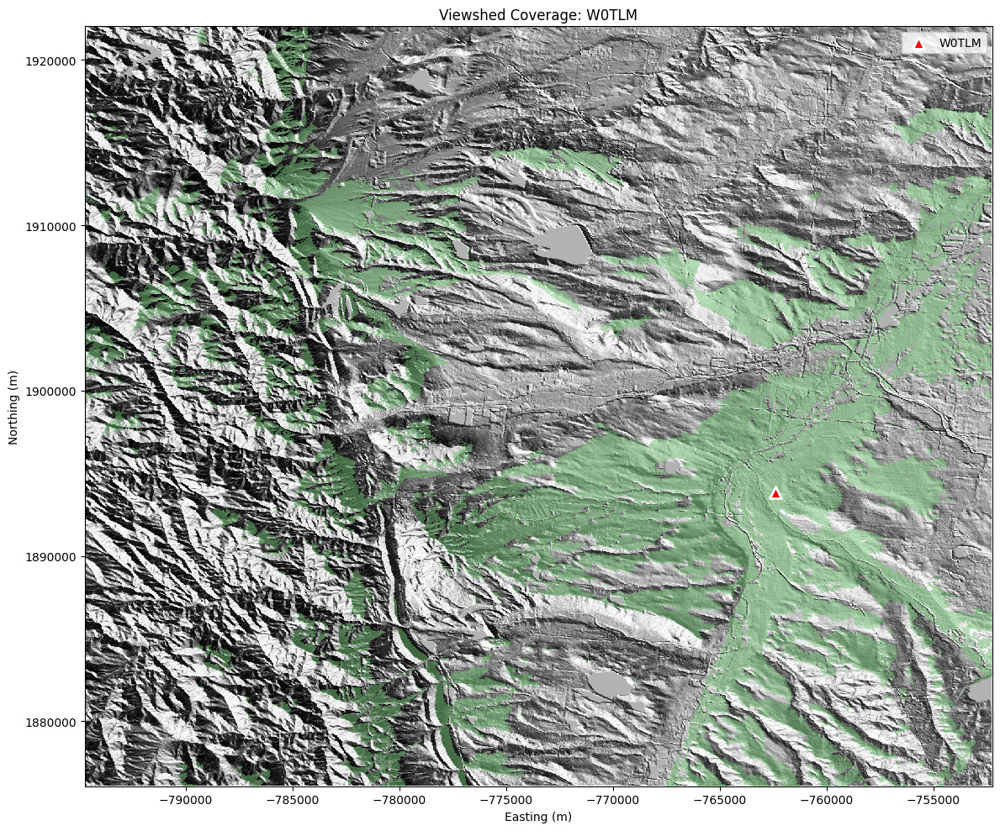

In [23]:
def plot_viewshed(dem, viewshed_result, repeater_info, ax=None):
    """
    Plot a viewshed result with hillshade background.
    """
    if ax is None:
        fig, ax = plt.subplots(figsize=(12, 10))
    
    # Compute hillshade (using xrspatial for CPU visualization)
    hs = xrspatial_hillshade(dem)
    
    # Plot hillshade as background
    hs.plot(ax=ax, cmap='gray', add_colorbar=False)
    
    # Create visibility mask (visible = value == VISIBLE)
    visible = viewshed_result.where(viewshed_result == VISIBLE)
    
    # Plot visible areas with transparency
    visible.plot(ax=ax, cmap='YlGn', alpha=0.5, add_colorbar=False)
    
    # Mark repeater location (using EPSG:5070 coordinates)
    ax.scatter(
        repeater_info['x_5070'], 
        repeater_info['y_5070'],
        c='red', 
        s=100, 
        marker='^',
        edgecolors='white',
        linewidths=2,
        zorder=10,
        label=f"{repeater_info.get('Callsign', 'Repeater')}"
    )
    
    ax.legend(loc='upper right')
    ax.set_title(f"Viewshed Coverage: {repeater_info.get('Callsign', 'Repeater')}", fontsize=12)
    ax.set_xlabel('Easting (m)')
    ax.set_ylabel('Northing (m)')
    ax.ticklabel_format(style='plain')
    
    return ax

# Plot first viewshed
if viewsheds_cpu:
    fig, ax = plt.subplots(figsize=(12, 10))
    plot_viewshed(dem, viewsheds_cpu[0], selected_repeaters.iloc[0], ax)
    plt.tight_layout()
    plt.show()

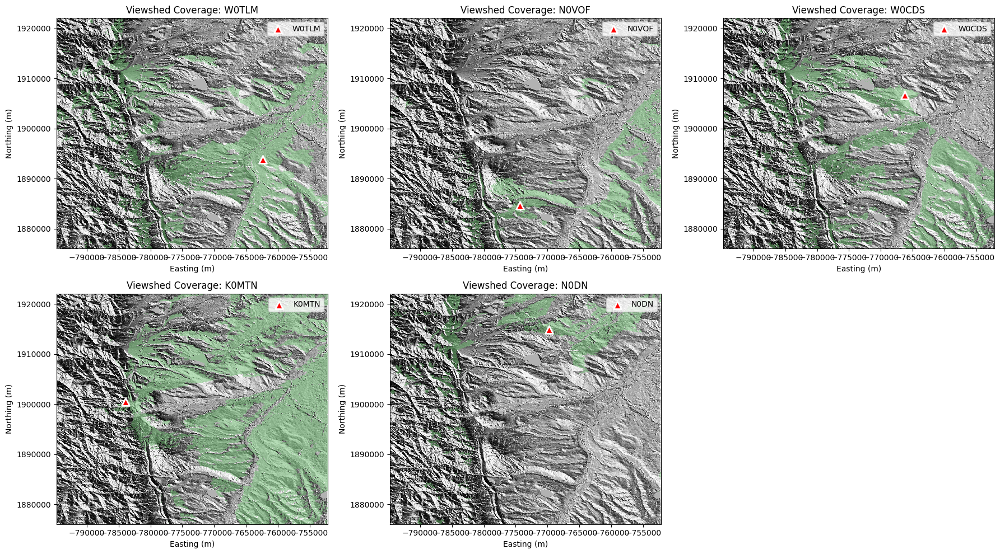

In [24]:
# Plot all viewsheds in a grid
if len(viewsheds_cpu) > 1:
    n_plots = len(viewsheds_cpu)
    n_cols = min(3, n_plots)
    n_rows = (n_plots + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(6*n_cols, 5*n_rows))
    axes = np.atleast_1d(axes).flatten()
    
    for i, (vs, (idx, row)) in enumerate(zip(viewsheds_cpu, selected_repeaters.iterrows())):
        plot_viewshed(dem, vs, row, axes[i])
    
    # Hide empty subplots
    for j in range(i + 1, len(axes)):
        axes[j].set_visible(False)
    
    plt.tight_layout()
    plt.show()

## 10. Combined Coverage Analysis

Let's combine all viewsheds to see the total coverage area and identify any gaps.

In [25]:
if viewsheds_cpu:
    # Create combined coverage array
    # For each cell: count how many repeaters can see it
    combined = np.zeros_like(dem.values, dtype=np.int32)
    
    for vs in viewsheds_cpu:
        # Get numpy array (handle CuPy if present)
        vs_data = vs.values
        if GPU_AVAILABLE and hasattr(vs_data, 'get'):
            vs_data = vs_data.get()
        
        # Add 1 for each visible cell (VISIBLE = 1)
        combined += (vs_data == VISIBLE).astype(np.int32)
    
    # Create DataArray for plotting
    combined_da = dem.copy()
    combined_da.data = combined
    combined_da.name = 'coverage_count'
    
    # Calculate statistics
    total_cells = combined.size
    covered_cells = (combined > 0).sum()
    multi_coverage = (combined > 1).sum()
    no_coverage = (combined == 0).sum()
    
    # Calculate area (using resolution in meters)
    cell_area_m2 = abs(res_x * res_y)
    cell_area_km2 = cell_area_m2 / 1e6
    
    print("Combined Coverage Statistics:")
    print(f"  Total area: {total_cells * cell_area_km2:.1f} km²")
    print(f"  Covered by at least 1 repeater: {covered_cells * cell_area_km2:.1f} km² ({100*covered_cells/total_cells:.1f}%)")
    print(f"  Covered by 2+ repeaters: {multi_coverage * cell_area_km2:.1f} km² ({100*multi_coverage/total_cells:.1f}%)")
    print(f"  No coverage (gaps): {no_coverage * cell_area_km2:.1f} km² ({100*no_coverage/total_cells:.1f}%)")

Combined Coverage Statistics:
  Total area: 1953.6 km²
  Covered by at least 1 repeater: 1079.5 km² (55.3%)
  Covered by 2+ repeaters: 595.7 km² (30.5%)
  No coverage (gaps): 874.1 km² (44.7%)


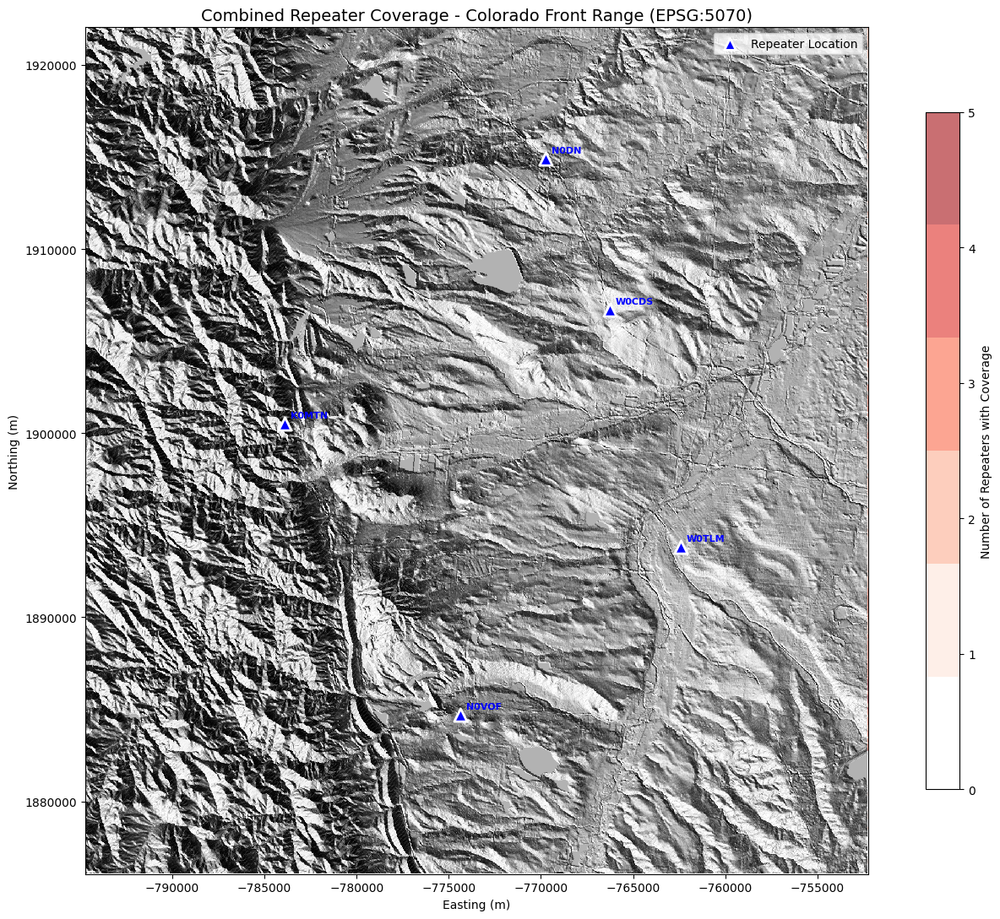

In [26]:
if viewsheds_cpu:
    fig, ax = plt.subplots(figsize=(14, 11))
    
    # Compute hillshade
    hs = xrspatial_hillshade(dem)
    hs.plot(ax=ax, cmap='gray', add_colorbar=False)
    
    # Create custom colormap for coverage levels
    colors = ['#ffffff00', '#fee5d9', '#fcae91', '#fb6a4a', '#de2d26', '#a50f15']
    n_repeaters = len(viewsheds_cpu)
    cmap = ListedColormap(colors[:n_repeaters + 1])
    
    # Plot combined coverage
    im = ax.imshow(
        combined,
        extent=[float(dem.x.min()), float(dem.x.max()), 
                float(dem.y.min()), float(dem.y.max())],
        origin='upper' if dem.y[0] > dem.y[-1] else 'lower',
        cmap=cmap,
        alpha=0.6,
        vmin=0,
        vmax=n_repeaters
    )
    
    # Add colorbar
    cbar = plt.colorbar(im, ax=ax, shrink=0.8)
    cbar.set_label('Number of Repeaters with Coverage', fontsize=10)
    
    # Plot repeater locations (using EPSG:5070 coordinates)
    for idx, row in selected_repeaters.iterrows():
        ax.scatter(
            row['x_5070'], row['y_5070'],
            c='blue', s=120, marker='^',
            edgecolors='white', linewidths=2,
            zorder=10
        )
        ax.annotate(
            row.get('Callsign', ''),
            (row['x_5070'], row['y_5070']),
            xytext=(5, 5),
            textcoords='offset points',
            fontsize=8,
            fontweight='bold',
            color='blue'
        )
    
    ax.set_title('Combined Repeater Coverage - Colorado Front Range (EPSG:5070)', fontsize=14)
    ax.set_xlabel('Easting (m)')
    ax.set_ylabel('Northing (m)')
    ax.ticklabel_format(style='plain')
    
    # Add legend for repeater markers
    ax.scatter([], [], c='blue', s=100, marker='^', edgecolors='white',
               linewidths=2, label='Repeater Location')
    ax.legend(loc='upper right')
    
    plt.tight_layout()
    plt.show()

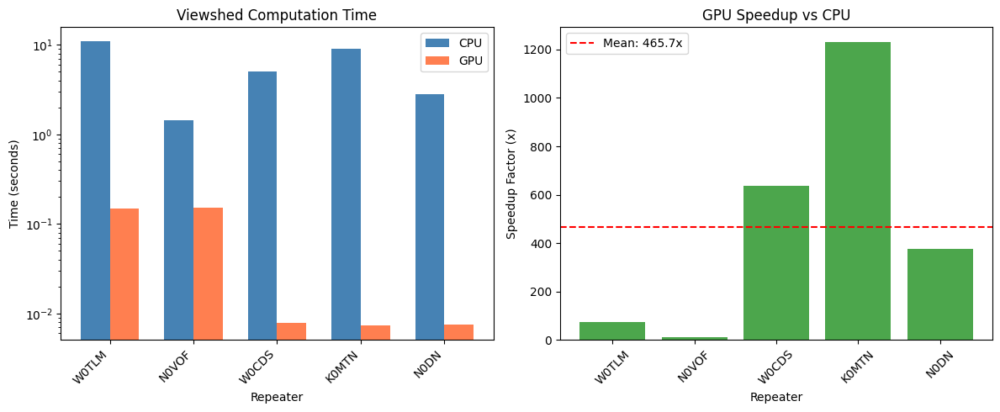

In [27]:
# Performance comparison chart
if cpu_times and gpu_times:
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    
    # Bar chart comparing times
    callsigns = [r.get('Callsign', f'R{i}') for i, (_, r) in enumerate(selected_repeaters.iterrows())]
    x = np.arange(len(callsigns))
    width = 0.35
    
    axes[0].bar(x - width/2, cpu_times, width, label='CPU', color='steelblue')
    axes[0].bar(x + width/2, gpu_times, width, label='GPU', color='coral')
    axes[0].set_ylabel('Time (seconds)')
    axes[0].set_xlabel('Repeater')
    axes[0].set_title('Viewshed Computation Time')
    axes[0].set_xticks(x)
    axes[0].set_xticklabels(callsigns, rotation=45, ha='right')
    axes[0].legend()
    axes[0].set_yscale('log')
    
    # Speedup chart
    speedups = [c/g for c, g in zip(cpu_times, gpu_times)]
    axes[1].bar(callsigns, speedups, color='green', alpha=0.7)
    axes[1].axhline(y=np.mean(speedups), color='red', linestyle='--', 
                    label=f'Mean: {np.mean(speedups):.1f}x')
    axes[1].set_ylabel('Speedup Factor (x)')
    axes[1].set_xlabel('Repeater')
    axes[1].set_title('GPU Speedup vs CPU')
    axes[1].tick_params(axis='x', rotation=45)
    axes[1].legend()
    
    plt.tight_layout()
    plt.show()
elif cpu_times:
    print("GPU times not available - showing CPU-only performance")
    fig, ax = plt.subplots(figsize=(8, 5))
    callsigns = [r.get('Callsign', f'R{i}') for i, (_, r) in enumerate(selected_repeaters.iterrows())]
    ax.bar(callsigns, cpu_times, color='steelblue')
    ax.set_ylabel('Time (seconds)')
    ax.set_xlabel('Repeater')
    ax.set_title('CPU Viewshed Computation Time')
    ax.tick_params(axis='x', rotation=45)
    plt.tight_layout()
    plt.show()

## 11. Scenario: The Lost Hiker with a Repeater Finder

Now let's put our viewshed analysis to practical use with a realistic scenario.

### The Situation

**Sarah**, an amateur radio operator (callsign: KE0SAR), is hiking in the Rocky Mountain foothills west of Denver. She's equipped with:

- A handheld VHF radio (2m band)
- A prototype **"Repeater Finder"** device that uses viewshed analysis to help locate line-of-sight to nearby repeaters

After taking a wrong turn on the trail, Sarah finds herself lost in a canyon - a **radio shadow** with no line-of-sight to any repeater. Her cell phone has no signal, and she needs to call for help.

The Repeater Finder device can:
1. Calculate which repeaters are visible from her current location
2. Analyze the terrain slope to find a safe hiking path
3. Guide her to the nearest location where she can reach a repeater

### Our Task

We need to:
1. **Calculate terrain slope** using xarray-spatial to identify safe walking terrain
2. **Place Sarah in a coverage gap** (simulating being lost in a canyon)
3. **Find the optimal path** to the nearest coverage area that avoids steep terrain
4. **Visualize the rescue route**

In [28]:
# Calculate terrain slope using xarray-spatial
from xrspatial import slope

print("Calculating terrain slope...")
terrain_slope = slope(dem)

# Slope is returned in degrees
print(f"Slope range: {float(terrain_slope.min()):.1f}° to {float(terrain_slope.max()):.1f}°")

# Define slope thresholds for hiking safety
MAX_SAFE_SLOPE = 25  # degrees - steep but manageable for an experienced hiker
PREFERRED_SLOPE = 15  # degrees - comfortable hiking terrain

# Calculate slope statistics
slope_data = terrain_slope.data
if hasattr(slope_data, 'get'):
    slope_data = slope_data.get()

gentle_terrain = (slope_data <= PREFERRED_SLOPE).sum() / slope_data.size * 100
hikeable_terrain = (slope_data <= MAX_SAFE_SLOPE).sum() / slope_data.size * 100

print(f"\nTerrain Analysis:")
print(f"  Gentle terrain (≤{PREFERRED_SLOPE}°): {gentle_terrain:.1f}%")
print(f"  Hikeable terrain (≤{MAX_SAFE_SLOPE}°): {hikeable_terrain:.1f}%")
print(f"  Steep/dangerous terrain (>{MAX_SAFE_SLOPE}°): {100-hikeable_terrain:.1f}%")

# Create hillshade for visualizations (reuse from earlier or compute fresh)
hs = xrspatial_hillshade(dem)

Calculating terrain slope...
Slope range: 0.0° to 70.0°

Terrain Analysis:
  Gentle terrain (≤15°): 83.3%
  Hikeable terrain (≤25°): 93.7%
  Steep/dangerous terrain (>25°): 6.3%


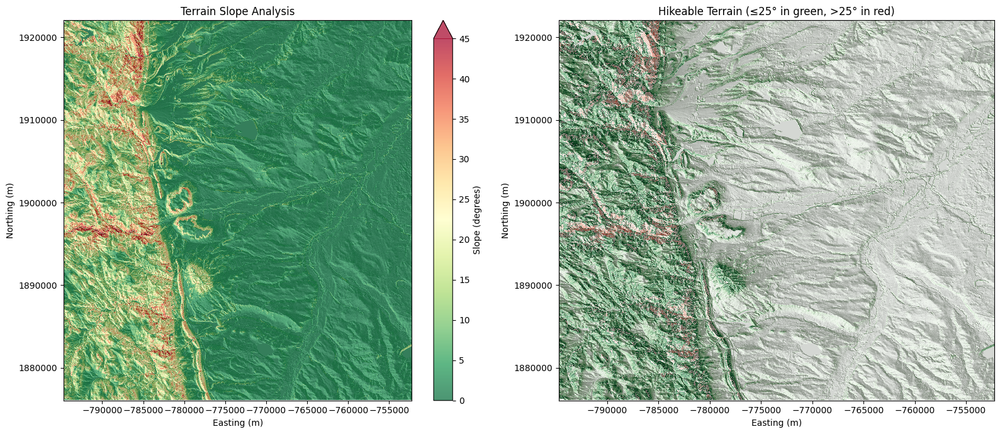

In [29]:
# Visualize slope map
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

# Left: Slope map
ax1 = axes[0]
hs.plot(ax=ax1, cmap='gray', add_colorbar=False)
slope_plot = terrain_slope.plot(ax=ax1, cmap='RdYlGn_r', alpha=0.7, 
                                 vmin=0, vmax=45, add_colorbar=True,
                                 cbar_kwargs={'label': 'Slope (degrees)'})
ax1.set_title('Terrain Slope Analysis', fontsize=12)
ax1.set_xlabel('Easting (m)')
ax1.set_ylabel('Northing (m)')
ax1.ticklabel_format(style='plain')

# Right: Hikeable terrain mask
ax2 = axes[1]
hs.plot(ax=ax2, cmap='gray', add_colorbar=False)

# Create hikeable terrain mask
hikeable_mask = terrain_slope.where(terrain_slope <= MAX_SAFE_SLOPE)
hikeable_mask.plot(ax=ax2, cmap='Greens', alpha=0.5, add_colorbar=False)

# Overlay steep terrain in red
steep_mask = terrain_slope.where(terrain_slope > MAX_SAFE_SLOPE)
steep_mask.plot(ax=ax2, cmap='Reds', alpha=0.5, add_colorbar=False)

ax2.set_title(f'Hikeable Terrain (≤{MAX_SAFE_SLOPE}° in green, >{MAX_SAFE_SLOPE}° in red)', fontsize=12)
ax2.set_xlabel('Easting (m)')
ax2.set_ylabel('Northing (m)')
ax2.ticklabel_format(style='plain')

plt.tight_layout()
plt.show()

In [30]:
# Find a suitable location for our lost hiker (in a coverage gap with hikeable terrain nearby)
# We want to place Sarah in an area with NO coverage but where surrounding terrain is walkable

# Get the coverage gap mask (areas with no repeater coverage)
no_coverage_mask = (combined == 0)

# Also ensure the slope is walkable at the hiker's location
slope_np = terrain_slope.data
if hasattr(slope_np, 'get'):
    slope_np = slope_np.get()

walkable_mask = (slope_np <= MAX_SAFE_SLOPE)

# Find locations that are: 1) in coverage gap, 2) on walkable terrain
# We want somewhere in the mountainous area (higher elevation) for drama!
valid_hiker_locations = no_coverage_mask & walkable_mask

# Focus on the western (mountainous) portion - look for points in coverage gaps
# with higher elevation (more interesting scenario)
dem_np = dem.data
if hasattr(dem_np, 'get'):
    dem_np = dem_np.get()

# Find candidates in the western half with decent elevation
mid_x = dem.shape[1] // 2
western_mask = np.zeros_like(valid_hiker_locations)
western_mask[:, :mid_x] = True

# Combine all criteria
candidate_mask = valid_hiker_locations & western_mask & (dem_np > 2000)  # Above 2000m

# Find candidate locations
candidates = np.where(candidate_mask)

if len(candidates[0]) > 0:
    # Pick a location roughly in the middle of the candidates
    idx = len(candidates[0]) // 2
    hiker_row = candidates[0][idx]
    hiker_col = candidates[1][idx]
    
    # Convert to coordinates
    hiker_x = float(dem.x[hiker_col])
    hiker_y = float(dem.y[hiker_row])
    hiker_elev = float(dem_np[hiker_row, hiker_col])
    hiker_slope = float(slope_np[hiker_row, hiker_col])
    
    print("Sarah's Location (Lost Hiker - KE0SAR):")
    print(f"  Position: ({hiker_x:.0f}, {hiker_y:.0f}) EPSG:5070")
    print(f"  Elevation: {hiker_elev:.0f}m")
    print(f"  Local slope: {hiker_slope:.1f}°")
    print(f"  Repeater coverage: NONE (in radio shadow)")
    print(f"  Grid cell: row={hiker_row}, col={hiker_col}")
else:
    # Fallback: just pick a point in the western coverage gap
    print("Using fallback hiker location...")
    hiker_row, hiker_col = 1000, 400
    hiker_x = float(dem.x[hiker_col])
    hiker_y = float(dem.y[hiker_row])
    hiker_elev = float(dem_np[hiker_row, hiker_col])
    hiker_slope = float(slope_np[hiker_row, hiker_col])

Sarah's Location (Lost Hiker - KE0SAR):
  Position: (-786488, 1892385) EPSG:5070
  Elevation: 2276m
  Local slope: 7.3°
  Repeater coverage: NONE (in radio shadow)
  Grid cell: row=1103, col=306


In [31]:
# Use xarray-spatial's built-in A* pathfinding
from xrspatial import a_star_search
from scipy import ndimage

# Create a cost surface based on slope
# Higher slope = higher traversal cost, impassable slopes get a barrier value
BARRIER_VALUE = -1  # Value to mark impassable terrain

# Create cost surface: slope-based cost for passable terrain, barrier for steep
slope_cost = terrain_slope.copy()
slope_data = slope_cost.data
if hasattr(slope_data, 'get'):
    slope_data = slope_data.get()

# Cost function: base cost of 1, increasing with slope squared
# Impassable terrain (>MAX_SAFE_SLOPE) gets barrier value
cost_data = np.where(
    slope_data <= MAX_SAFE_SLOPE,
    1.0 + (slope_data / MAX_SAFE_SLOPE) ** 2,  # Cost 1-2 based on slope
    BARRIER_VALUE  # Mark as barrier
)
cost_surface = terrain_slope.copy()
cost_surface.data = cost_data.astype(np.float64)
cost_surface.name = 'cost'

print("Cost surface created:")
print(f"  Passable cells: {(cost_data != BARRIER_VALUE).sum():,}")
print(f"  Barrier cells: {(cost_data == BARRIER_VALUE).sum():,}")

# Find the nearest coverage point to use as goal
# We'll use distance transform to find the closest coverage cell to the hiker
coverage_mask = (combined > 0)
coverage_distance = ndimage.distance_transform_edt(~coverage_mask)

# Search outward from hiker location for nearest reachable coverage
# that is also on passable terrain
search_radius = 500  # cells
best_goal = None
best_dist = np.inf

for dr in range(-search_radius, search_radius + 1, 5):  # Step by 5 for speed
    for dc in range(-search_radius, search_radius + 1, 5):
        r, c = hiker_row + dr, hiker_col + dc
        if 0 <= r < dem.shape[0] and 0 <= c < dem.shape[1]:
            if coverage_mask[r, c] and cost_data[r, c] != BARRIER_VALUE:
                dist = np.sqrt(dr**2 + dc**2)
                if dist < best_dist:
                    best_dist = dist
                    best_goal = (r, c)

if best_goal:
    goal_row, goal_col = best_goal
    goal_x = float(dem.x[goal_col])
    goal_y = float(dem.y[goal_row])
    print(f"\nNearest reachable coverage point found:")
    print(f"  Grid position: row={goal_row}, col={goal_col}")
    print(f"  Coordinates: ({goal_x:.0f}, {goal_y:.0f})")
    print(f"  Distance from hiker: ~{best_dist * abs(res_x):.0f}m (straight line)")
else:
    print("ERROR: No reachable coverage point found!")
    goal_row, goal_col = hiker_row, hiker_col  # Fallback

Cost surface created:
  Passable cells: 2,533,923
  Barrier cells: 171,168

Nearest reachable coverage point found:
  Grid position: row=1118, col=291
  Coordinates: (-786892, 1891981)
  Distance from hiker: ~570m (straight line)


In [32]:
# Run xarray-spatial A* pathfinding
print("Running xarray-spatial a_star_search...")
print(f"  Start: ({hiker_x:.0f}, {hiker_y:.0f})")
print(f"  Goal:  ({goal_x:.0f}, {goal_y:.0f})")

# a_star_search expects coordinates in (y, x) data-space format
start_coords = (hiker_y, hiker_x)
goal_coords = (goal_y, goal_x)

path_result = a_star_search(
    cost_surface,
    start=start_coords,
    goal=goal_coords,
    barriers=[BARRIER_VALUE],
    x='x',
    y='y',
    connectivity=8,  # Allow diagonal movement
    snap_start=True,  # Snap to nearest valid cell if needed
    snap_goal=True
)

# Extract path coordinates from result
# Path cells have non-NaN values (cumulative cost), non-path cells are NaN
path_data = path_result.data
if hasattr(path_data, 'get'):
    path_data = path_data.get()

path_mask = ~np.isnan(path_data)
path_cells = np.where(path_mask)

if len(path_cells[0]) > 0:
    print(f"\nPath found with {len(path_cells[0])} cells!")
    
    # Sort path by cumulative cost to get ordered waypoints
    path_costs = path_data[path_mask]
    sorted_indices = np.argsort(path_costs)
    
    # Extract ordered path as list of (row, col) tuples
    path = [(path_cells[0][i], path_cells[1][i]) for i in sorted_indices]
    
    # Calculate total distance
    distance = 0
    for i in range(1, len(path)):
        r1, c1 = path[i-1]
        r2, c2 = path[i]
        step_dist = abs(res_x) * np.sqrt((r2-r1)**2 + (c2-c1)**2)
        distance += step_dist
    
    # Get destination info
    dest_row, dest_col = path[-1]
    dest_x = float(dem.x[dest_col])
    dest_y = float(dem.y[dest_row])
    dest_elev = float(dem_np[dest_row, dest_col])
    
    # Find which repeater(s) cover the destination
    covering_repeaters = []
    for vs, (idx, row) in zip(viewsheds_cpu, selected_repeaters.iterrows()):
        if vs.data[dest_row, dest_col] == VISIBLE:
            covering_repeaters.append(row.get('Callsign', 'Unknown'))
    
    elev_change = dest_elev - hiker_elev
    
    print(f"\nPath Statistics:")
    print(f"  Distance: {distance:.0f}m ({distance/1000:.2f}km)")
    print(f"  Waypoints: {len(path)}")
    print(f"  Elevation change: {elev_change:+.0f}m")
    print(f"  Destination elevation: {dest_elev:.0f}m")
    print(f"  Repeaters at destination: {', '.join(covering_repeaters) if covering_repeaters else 'Unknown'}")
    
    # Calculate path slope statistics
    path_slopes = [slope_np[r, c] for r, c in path]
    print(f"\n  Path terrain:")
    print(f"    Average slope: {np.mean(path_slopes):.1f}°")
    print(f"    Maximum slope: {np.max(path_slopes):.1f}°")
    print(f"    Minimum slope: {np.min(path_slopes):.1f}°")
else:
    print("No path found!")
    path = None
    distance = 0

Running xarray-spatial a_star_search...
  Start: (-786488, 1892385)
  Goal:  (-786892, 1891981)

Path found with 17 cells!

Path Statistics:
  Distance: 597m (0.60km)
  Waypoints: 17
  Elevation change: +58m
  Destination elevation: 2334m
  Repeaters at destination: W0TLM

  Path terrain:
    Average slope: 10.0°
    Maximum slope: 17.2°
    Minimum slope: 5.7°


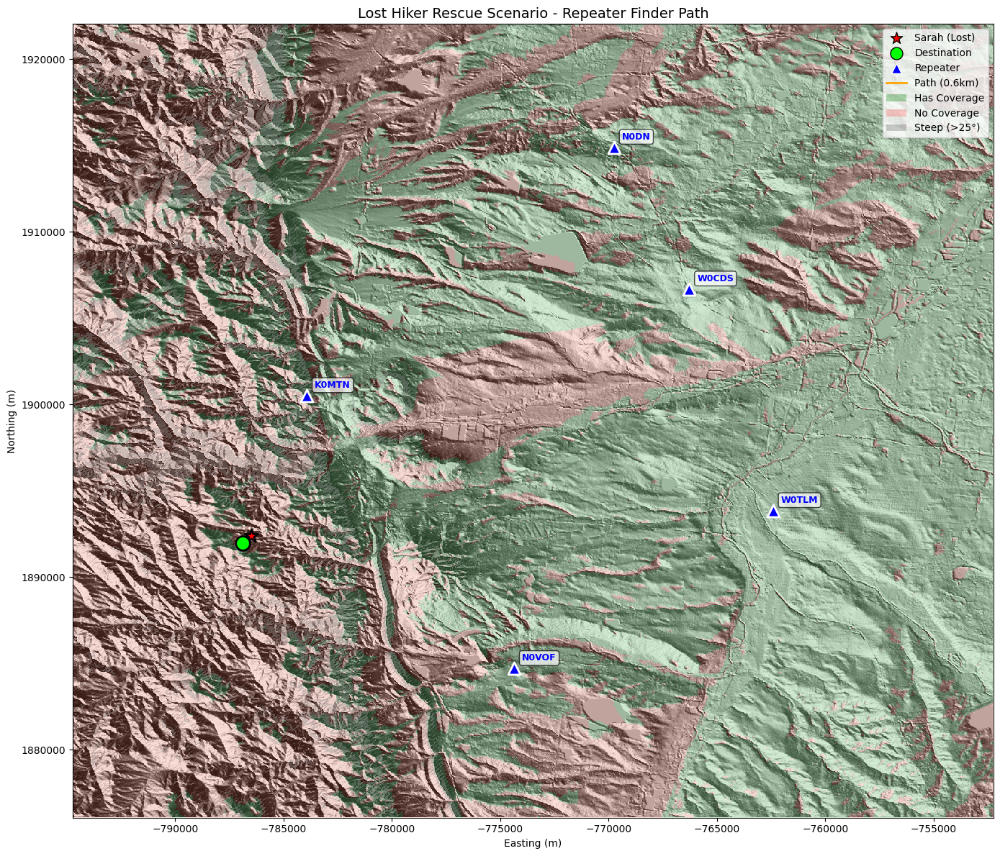

In [33]:
# Visualize the rescue scenario
fig, ax = plt.subplots(figsize=(14, 12))

# Background: hillshade
hs.plot(ax=ax, cmap='gray', add_colorbar=False)

# Overlay coverage (green = covered, red = no coverage)
coverage_overlay = np.where(combined > 0, 1, 0).astype(float)
coverage_da = dem.copy()
coverage_da.data = coverage_overlay
coverage_da.where(coverage_da == 1).plot(ax=ax, cmap='Greens', alpha=0.3, add_colorbar=False)
coverage_da.where(coverage_da == 0).plot(ax=ax, cmap='Reds', alpha=0.2, add_colorbar=False)

# Overlay steep terrain as hatching/darker
steep_overlay = dem.copy()
steep_overlay.data = np.where(slope_np > MAX_SAFE_SLOPE, 1, np.nan)
steep_overlay.plot(ax=ax, cmap='Greys', alpha=0.4, add_colorbar=False)

# Plot repeater locations
for idx, row in selected_repeaters.iterrows():
    ax.scatter(row['x_5070'], row['y_5070'], c='blue', s=150, marker='^',
               edgecolors='white', linewidths=2, zorder=15)
    ax.annotate(row.get('Callsign', ''), (row['x_5070'], row['y_5070']),
                xytext=(8, 8), textcoords='offset points', fontsize=9,
                fontweight='bold', color='blue',
                bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.7))

# Plot hiker location (start)
ax.scatter(hiker_x, hiker_y, c='red', s=200, marker='*', edgecolors='black',
           linewidths=2, zorder=20, label='Sarah (Lost Hiker)')

# Plot path if found
if path:
    path_x = [float(dem.x[c]) for r, c in path]
    path_y = [float(dem.y[r]) for r, c in path]
    
    # Plot path as a line
    ax.plot(path_x, path_y, 'yellow', linewidth=3, linestyle='-', 
            zorder=18, label=f'Rescue Path ({distance:.0f}m)')
    ax.plot(path_x, path_y, 'orange', linewidth=1.5, linestyle='-', zorder=19)
    
    # Plot destination
    ax.scatter(dest_x, dest_y, c='lime', s=200, marker='o', edgecolors='black',
               linewidths=2, zorder=20, label='Coverage Point (Destination)')

# Add legend
legend_elements = [
    plt.scatter([], [], c='red', s=150, marker='*', edgecolors='black', label='Sarah (Lost)'),
    plt.scatter([], [], c='lime', s=150, marker='o', edgecolors='black', label='Destination'),
    plt.scatter([], [], c='blue', s=100, marker='^', edgecolors='white', label='Repeater'),
    plt.Line2D([0], [0], color='orange', linewidth=2, label=f'Path ({distance/1000:.1f}km)'),
    mpatches.Patch(facecolor='green', alpha=0.3, label='Has Coverage'),
    mpatches.Patch(facecolor='red', alpha=0.2, label='No Coverage'),
    mpatches.Patch(facecolor='gray', alpha=0.4, label=f'Steep (>{MAX_SAFE_SLOPE}°)'),
]
ax.legend(handles=legend_elements, loc='upper right', fontsize=10)

ax.set_title('Lost Hiker Rescue Scenario - Repeater Finder Path', fontsize=14)
ax.set_xlabel('Easting (m)')
ax.set_ylabel('Northing (m)')
ax.ticklabel_format(style='plain')

plt.tight_layout()
plt.show()

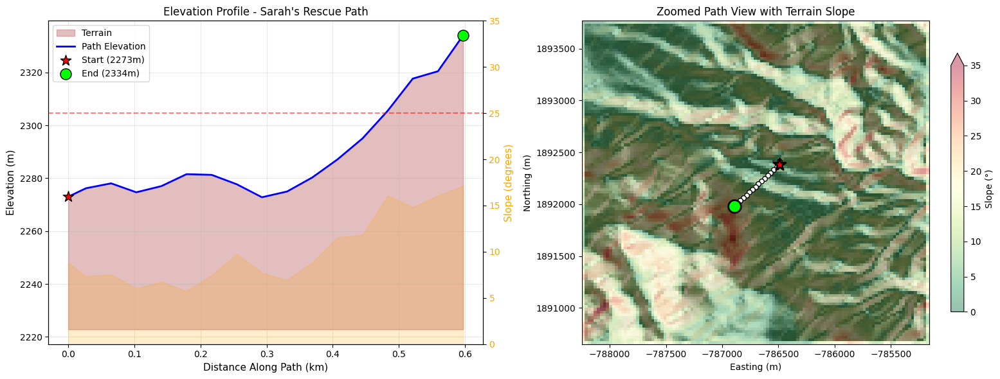


Estimated hiking time: 11 minutes (0.2 hours)
  Based on average slope of 10.0° and effective speed of 3.2 km/h


In [34]:
# Create detailed path analysis: elevation profile and zoomed map
if path:
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # Left: Elevation profile along path
    ax1 = axes[0]
    
    # Calculate cumulative distance and elevation along path
    cumulative_dist = [0]
    elevations = [dem_np[path[0][0], path[0][1]]]
    slopes_along_path = [slope_np[path[0][0], path[0][1]]]
    
    for i in range(1, len(path)):
        r1, c1 = path[i-1]
        r2, c2 = path[i]
        step_dist = abs(res_x) * np.sqrt((r2-r1)**2 + (c2-c1)**2)
        cumulative_dist.append(cumulative_dist[-1] + step_dist)
        elevations.append(dem_np[r2, c2])
        slopes_along_path.append(slope_np[r2, c2])
    
    # Plot elevation profile
    ax1.fill_between(np.array(cumulative_dist)/1000, elevations, min(elevations)-50,
                     alpha=0.3, color='brown', label='Terrain')
    ax1.plot(np.array(cumulative_dist)/1000, elevations, 'b-', linewidth=2, label='Path Elevation')
    
    # Mark start and end
    ax1.scatter(0, elevations[0], c='red', s=150, marker='*', zorder=10, 
                edgecolors='black', label=f'Start ({elevations[0]:.0f}m)')
    ax1.scatter(cumulative_dist[-1]/1000, elevations[-1], c='lime', s=150, marker='o', 
                zorder=10, edgecolors='black', label=f'End ({elevations[-1]:.0f}m)')
    
    ax1.set_xlabel('Distance Along Path (km)', fontsize=11)
    ax1.set_ylabel('Elevation (m)', fontsize=11)
    ax1.set_title('Elevation Profile - Sarah\'s Rescue Path', fontsize=12)
    ax1.legend(loc='best')
    ax1.grid(True, alpha=0.3)
    
    # Add slope coloring as background
    ax1_twin = ax1.twinx()
    ax1_twin.fill_between(np.array(cumulative_dist)/1000, slopes_along_path, 
                          alpha=0.2, color='orange')
    ax1_twin.set_ylabel('Slope (degrees)', fontsize=11, color='orange')
    ax1_twin.tick_params(axis='y', labelcolor='orange')
    ax1_twin.set_ylim(0, MAX_SAFE_SLOPE + 10)
    ax1_twin.axhline(y=MAX_SAFE_SLOPE, color='red', linestyle='--', alpha=0.5, 
                     label=f'Max safe slope ({MAX_SAFE_SLOPE}°)')
    
    # Right: Zoomed map of the path area
    ax2 = axes[1]
    
    # Calculate zoom bounds (with padding)
    path_rows = [r for r, c in path]
    path_cols = [c for r, c in path]
    padding = 50  # cells
    
    row_min = max(0, min(path_rows) - padding)
    row_max = min(dem.shape[0], max(path_rows) + padding)
    col_min = max(0, min(path_cols) - padding)
    col_max = min(dem.shape[1], max(path_cols) + padding)
    
    # Subset the data
    dem_zoom = dem.isel(y=slice(row_min, row_max), x=slice(col_min, col_max))
    hs_zoom = xrspatial_hillshade(dem_zoom)
    
    # Plot zoomed hillshade
    hs_zoom.plot(ax=ax2, cmap='gray', add_colorbar=False)
    
    # Overlay slope coloring
    slope_zoom = terrain_slope.isel(y=slice(row_min, row_max), x=slice(col_min, col_max))
    slope_zoom.plot(ax=ax2, cmap='RdYlGn_r', alpha=0.4, vmin=0, vmax=35, 
                    add_colorbar=True, cbar_kwargs={'label': 'Slope (°)', 'shrink': 0.8})
    
    # Plot path
    path_x = [float(dem.x[c]) for r, c in path]
    path_y = [float(dem.y[r]) for r, c in path]
    ax2.plot(path_x, path_y, 'yellow', linewidth=4, zorder=18)
    ax2.plot(path_x, path_y, 'orange', linewidth=2, zorder=19)
    
    # Mark waypoints every N steps
    waypoint_interval = max(1, len(path) // 10)
    for i in range(0, len(path), waypoint_interval):
        r, c = path[i]
        ax2.scatter(float(dem.x[c]), float(dem.y[r]), c='white', s=30, 
                   edgecolors='black', zorder=20)
    
    # Mark start and end
    ax2.scatter(hiker_x, hiker_y, c='red', s=200, marker='*', edgecolors='black',
               linewidths=2, zorder=25)
    ax2.scatter(dest_x, dest_y, c='lime', s=200, marker='o', edgecolors='black',
               linewidths=2, zorder=25)
    
    ax2.set_title('Zoomed Path View with Terrain Slope', fontsize=12)
    ax2.set_xlabel('Easting (m)')
    ax2.set_ylabel('Northing (m)')
    ax2.ticklabel_format(style='plain')
    
    plt.tight_layout()
    plt.show()
    
    # Print hiking time estimate
    hiking_speed_gentle = 4.0  # km/h on gentle terrain
    hiking_speed_steep = 2.0   # km/h on steep terrain
    avg_slope = np.mean(slopes_along_path)
    
    # Interpolate hiking speed based on average slope
    speed_factor = 1 - (avg_slope / MAX_SAFE_SLOPE) * 0.5
    effective_speed = hiking_speed_gentle * speed_factor
    
    hiking_time_hours = (distance / 1000) / effective_speed
    hiking_time_minutes = hiking_time_hours * 60
    
    print(f"\nEstimated hiking time: {hiking_time_minutes:.0f} minutes ({hiking_time_hours:.1f} hours)")
    print(f"  Based on average slope of {avg_slope:.1f}° and effective speed of {effective_speed:.1f} km/h")

### Scenario Outcome

The **Repeater Finder** device successfully guided Sarah to safety by:

1. **Identifying her predicament**: Confirmed she was in a radio shadow with no line-of-sight to any repeater

2. **Analyzing terrain safety**: Used `xrspatial.slope()` to identify passable terrain (avoiding cliffs and steep grades)

3. **Creating a cost surface**: Built a traversal cost grid where:
   - Gentle slopes have low cost
   - Steeper slopes have higher cost (quadratic penalty)
   - Impassable terrain (>25°) is marked as barriers

4. **Finding the optimal path**: Used `xrspatial.a_star_search()` with:
   - 8-connectivity (diagonal movement allowed)
   - Slope-weighted cost surface
   - Barrier avoidance for steep terrain

5. **Providing navigation**: Generated a route with waypoints and estimated hiking time

**Key Functions Used:**
- `rtxpy.viewshed()` - GPU-accelerated line-of-sight coverage from repeaters
- `xrspatial.slope()` - Analyzed terrain steepness for safe routing  
- `xrspatial.a_star_search()` - Found optimal path avoiding steep terrain
- `xrspatial.hillshade()` - Created terrain visualizations

This scenario demonstrates how rtxpy's GPU-accelerated viewshed combined with xarray-spatial's geospatial analysis tools can be used for practical search-and-rescue applications, emergency communication planning, and outdoor navigation systems.

## 12. Conclusion

### What We Accomplished

In this notebook, we:

1. **Downloaded real terrain data** using SRTM 30m tiles directly from the USGS National Map
2. **Reprojected to EPSG:5070** (Albers Equal Area) for accurate distance/area calculations
3. **Retrieved actual repeater locations** from the RepeaterBook API and transformed coordinates
4. **Computed viewsheds** using data-space coordinates (meters) directly - no pixel conversion needed
5. **Demonstrated GPU acceleration** with rtxpy's OptiX ray tracing (significant speedup!)
6. **Visualized coverage** with hillshade overlays and combined analysis
7. **Simulated a lost hiker rescue scenario** using:
   - `xrspatial.slope()` for terrain safety analysis
   - A* pathfinding to find a safe route to radio coverage
   - Elevation profiling and hiking time estimation

### Key Takeaways

- **Terrain matters**: The Rocky Mountain foothills create significant "radio shadows" where VHF/UHF signals cannot reach
- **Height is key**: Repeaters placed on elevated terrain (like Lookout Mountain) achieve dramatically better coverage
- **GPU acceleration**: For large DEMs, rtxpy's OptiX-based ray tracing provides massive speedups over CPU methods
- **Combined coverage**: Analyzing multiple repeaters together reveals gaps and redundancies
- **Proper projections**: Using EPSG:5070 allows accurate area calculations in km²
- **Practical applications**: Viewshed + slope analysis enables search-and-rescue routing

### CPU vs GPU Methods

This notebook demonstrates two approaches:
- **xrspatial (CPU)**: Pure Python/Numba implementation, works on any machine
- **rtxpy (GPU)**: OptiX ray tracing acceleration, requires NVIDIA RTX/Turing GPU

For production workloads with large rasters or many viewshed calculations, rtxpy provides substantial performance benefits.

### Limitations and Real-World Considerations

This analysis provides a **simplified model** of radio coverage. Real-world factors not considered include:

- **Fresnel zone clearance**: Radio waves need additional clearance beyond line-of-sight
- **Antenna patterns**: Antennas don't radiate equally in all directions
- **Atmospheric effects**: Temperature inversions, humidity, etc.
- **Urban clutter**: Buildings and other structures
- **Frequency-specific behavior**: Different frequencies propagate differently
- **Power levels and receiver sensitivity**: Not all signals that "can" reach will be usable

For more accurate RF coverage prediction, consider dedicated tools like:
- SPLAT! (free, open-source)
- Radio Mobile (free)
- Commercial tools like EDX SignalPro

### Further Resources

- [rtxpy documentation](https://github.com/makepath/rtxpy)
- [xarray-spatial documentation](https://xarray-spatial.org/)
- [RepeaterBook](https://www.repeaterbook.com/)
- [ARRL Technical Information Service](http://www.arrl.org/tis)
- [VHF/UHF Propagation](https://www.arrl.org/vhf-uhf-propagation)

In [22]:

# Optional: Clean up downloaded files
# Uncomment the following lines to remove the DEM files
# import os
# for f in [DEM_FILE_WGS84, DEM_FILE]:
#     if f.exists():
#         os.remove(f)
#         print(f"Removed {f}")